In [ ]:
from abc import ABC, abstractmethod
from dataclasses import dataclass
from fastai.vision.all import *
from fastai.vision.gan import *
from functools import partial
import gc
import itertools
import numpy as np 
import pandas as pd
from pathlib import Path
import seaborn as sns
import subprocess
from sys import platform
import torch
import torch.nn as nn
import torch.nn.functional as F
from typing import Callable, List, Tuple, Union

In [2]:
run_as_standalone_nb = False

In [3]:
if run_as_standalone_nb:
    root_lib_path = Path('face2anime').resolve()
    if not root_lib_path.exists():
        !git clone https://github.com/davidleonfdez/face2anime.git
    if str(root_lib_path) not in sys.path:
        sys.path.insert(0, str(root_lib_path))
else:
    import local_lib_import

In [4]:
from face2anime.gen_utils import is_iterable
from face2anime.layers import (ConcatPoolHalfDownsamplingOp2d, ConvHalfDownsamplingOp2d, FeatureStatType, 
                               TransformsLayer, ParentNetSource, ResBlockDown)
from face2anime.losses import (ContentLossCallback, CritPredsTracker, CycleConsistencyLossCallback, 
                               CrossIdentityLossCallback, CycleGANLoss, IdentityLossCallback, LossWrapper, 
                               MultiCritPredsTracker, R1GANGPCallback)
from face2anime.misc import FeaturesCalculator
from face2anime.networks import (CycleCritic, CycleGenerator, default_decoder, default_encoder, 
                                 Img2ImgGenerator, PatchResCritic, res_critic)
from face2anime.plot import plot_c_preds, plot_multi_c_preds
from face2anime.train_utils import (add_ema_to_gan_learner, clean_mem, custom_load_model,
                                    custom_save_model, SaveCheckpointsCallback)
from face2anime.transforms import AdaptiveAugmentsCallback, ADATransforms

In [5]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
img_size = 64
n_channels = 3
bs = 64
save_cycle_len = 5

# Data

You need to use two different datasets, with each of them containing images from one specific domain.

## Domain A ds

`input_a_fns` must be set to a list that contains the paths of the training images that belong to domain A. For example:

In [ ]:
celeba_path = Path('/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba')
input_a_fns = celeba_path.ls()
input_a_fns

## Domain B ds

The value of `anime_ds_path` must be set to the path of the parent folder of the training images that belong to domain B. 

In this example, the ds used is a custom one composed by 17k images cropped from other more general datasets.

In [ ]:
anime_ds_path = Path('/kaggle/input/the-ultimate-anime-faces-dataset/content/color_filtered')

The ds path passed to `dblock.dataloaders()` or `ImageDataLoaders.from_dblock()` will be forwarded
to `get_items`, which will return a list of items, usually a list of image paths if `get_items=get_image_files`.

So, for each item, we are expected to receive a filename `fn` and be able to
derive x and y from it, with `get_x(fn)` and `get_y(fn)`.

For bidirectional unpaired image to image translation, we can:
* Use the domain B ds path as the DataBlock `source`. 
* Load independently the filenames of the domain A ds; let's call it `input_a_fns`
* `get_y` needs two functions:
  * The first one can just return the path received (domain B).
  * The second returns a random item from `input_a_fns` (domain A).
* `get_x` also needs two functions:
  * The first one return a random item from `input_a_fns` (domain A).
  * The second can just return the path received (domain B).
* `get_x` and `get_y` are called every time a data item is used; so, by using random, we can be sure every x is not tied to a fixed y; i.e., they won't be together in the same (x, y) batch every epoch for loss calculation.
* In this case, domain A: human faces; domain B: anime faces.


In [9]:
class Domain(Enum):
    A = 0
    B = 1


def reverse_domain(domain): return Domain.B if domain == Domain.A else Domain.A


def get_random_fn_a(fn):
    return input_a_fns[random.randint(0, len(input_a_fns)-1)]


def get_input_dependant_fn_a(fn):
    return input_a_fns[hash(fn) % len(input_a_fns)]


normalize_tf = Normalize.from_stats(torch.tensor([0.5,0.5,0.5]), torch.tensor([0.5,0.5,0.5]))


def get_dblock(extra_batch_tfms=None, random_fn_a=True):
    if extra_batch_tfms is None: extra_batch_tfms = []
    get_fn_a = get_random_fn_a if random_fn_a else get_input_dependant_fn_a
    return DataBlock(blocks=(ImageBlock, ImageBlock, ImageBlock, ImageBlock),
                     get_x=[get_fn_a, noop],
                     get_y=[noop, get_fn_a],
                     get_items=get_image_files,
                     #get_items=lambda path: target_fns,
                     #get_items=lambda path: anime_ds_path.ls()[:10],
                     splitter=IndexSplitter([]),
                     item_tfms=Resize(img_size, method=ResizeMethod.Crop), 
                     batch_tfms=[normalize_tf] + extra_batch_tfms,
                     n_inp=2)

dblock = get_dblock()
main_path = anime_ds_path
dls = dblock.dataloaders(main_path, path=main_path, bs=bs)

In [ ]:
sample_batch = dls.one_batch()
titles = ['x1 (A)', 'x2 (B)', 'y1 (B)', 'y2 (A)']
_, axs = plt.subplots(1, 4)
for t, ax, title in zip(sample_batch, axs, titles):
    normalize_tf.decode(t)[0].show(ax=ax, title=title)

------------------

# Helper methods

In [10]:
def predict_n(learner, inputs_idxs:Union[int, Tuple[int, int]], max_bs=64):
    dummy_path = Path('.')
    items = learner.dls.train.items
    if isinstance(inputs_idxs, int):
        n_imgs = inputs_idxs
        ini_idx = 0
        end_idx = n_imgs
    else:
        ini_idx, end_idx = inputs_idxs
        n_imgs = end_idx - ini_idx
    if len(items) < end_idx: items = list(itertools.islice(itertools.cycle(items), ini_idx, end_idx))
    dl = learner.dls.test_dl(items[:n_imgs], bs=max_bs)   
    inp, _, _, dec_imgs_t = learner.get_preds(dl=dl, with_input=True, with_decoded=True)
    dec_batch = dls.decode_batch(inp + dec_imgs_t, max_n=n_imgs)
    return dec_batch


def predict_show_n(learner, n_imgs, **predict_n_kwargs):
    preds_batch = predict_n(learner, n_imgs, **predict_n_kwargs)
    _, axs = plt.subplots(n_imgs, 4, figsize=(12, n_imgs * 3))
    for i, (in_a, in_b, pred_a2b, pred_b2a) in enumerate(preds_batch):
        in_a.show(ax=axs[i][0], title='In A')
        pred_a2b.show(ax=axs[i][1], title='Out A->B')
        in_b.show(ax=axs[i][2], title='In B')
        pred_b2a.show(ax=axs[i][3], title='Out B->A')
        
        
def save_preds(c_preds_tracker, filepaths):
    return [df.to_csv(filepath) for df, filepath in zip(c_preds_tracker.to_dfs(), filepaths)]

In [11]:
def _forward_batch(model, batch, device):
    input = batch[:2]
    if device is not None:
        for i in range(2): input[i] = input[i].to(device)
    model(*input)


@dataclass
class ADAConfig:
    p_change_thresh:float=0.6
    filter_tfms_to_array:Callable=None
    ada_domain_a:bool=True
    ada_domain_b:bool=True


def create_learner(for_inference=False, dblock=dblock, dls=dls, gp_w=10., latent_sz=100, 
                   mid_mlp_depth=2, g_norm=NormType.Instance, n_crit_iters=3,
                   n_extra_convs_by_c_res_block=1, gan_loss_fn=nn.BCEWithLogitsLoss, 
                   cycle_cons_w=0, id_loss_w=0, cross_id_loss_w=0, use_patch_critic=False, 
                   ftrs_stats=FeatureStatType.NONE, ftrs_stats_source=None, ada_conf=None):
    use_ada = (ada_conf is not None) and (ada_conf.ada_domain_a or ada_conf.ada_domain_b)
    leakyReLU02 = partial(nn.LeakyReLU, negative_slope=0.2)
    down_op = ConvHalfDownsamplingOp2d(ks=4, act_cls=leakyReLU02, bn_1st=False,
                                       norm_type=NormType.Batch)
    id_down_op = ConcatPoolHalfDownsamplingOp2d(conv_ks=3, act_cls=None, norm_type=None)
    crit_args = [img_size, n_channels, down_op, id_down_op]
    if use_patch_critic: crit_args.insert(2, img_size//8)
    crit_kwargs = dict(n_extra_convs_by_res_block=n_extra_convs_by_c_res_block, 
                       act_cls=leakyReLU02, bn_1st=False, n_features=128, 
                       flatten_full=True)
    if use_patch_critic:
        crit_kwargs['ftrs_stats'] = ftrs_stats
        crit_kwargs['ftrs_stats_source'] = ftrs_stats_source
        crit_kwargs['input_norm_tf'] = normalize_tf
        crit_kwargs['device'] = device
    crit_builder = PatchResCritic if use_patch_critic else res_critic  
    base_critics_l = [crit_builder(*crit_args, **crit_kwargs) for _ in range(2)]
    base_critics = CycleCritic(*base_critics_l)
    if not use_ada:
        critic = base_critics
    
    def _decoder_builder(imsz, nch, latsz, hooks_by_sz=None): 
        return default_decoder(imsz, nch, latsz, norm_type=g_norm, hooks_by_sz=hooks_by_sz)
    generators = [Img2ImgGenerator(img_size, n_channels, mid_mlp_depth=mid_mlp_depth, skip_connect=True,
                                   encoder=default_encoder(img_size, n_channels, latent_sz, norm_type=g_norm),
                                   decoder_builder=_decoder_builder)
                  for _ in range(2)]
    generator = CycleGenerator(*generators)
    
    cbs = []
    c_loss_interceptors = []
    metrics = []
    tfms_array = []
    if not for_inference:
        # Pass base_critic to avoid grid_sample 2nd order derivative issue with ada critic
        cbs.append(R1GANGPCallback(weight=gp_w, critic=base_critics))
        if cycle_cons_w > 0: 
            cbs.append(CycleConsistencyLossCallback(generator.g_a2b, 
                                                    generator.g_b2a, 
                                                    weight=cycle_cons_w))
            metrics.append('cycle_loss')
        if id_loss_w > 0:
            cbs.append(IdentityLossCallback(generator.g_a2b, 
                                            generator.g_b2a, 
                                            weight=id_loss_w))
            metrics.append('identity_loss')
        if cross_id_loss_w > 0:
            cbs.append(CrossIdentityLossCallback(generator.g_a2b, 
                                                 generator.g_b2a, 
                                                 weight=cross_id_loss_w))
            metrics.append('cross_identity_loss')
        if use_ada:
            ada_tfms = ADATransforms(0., (img_size, img_size))
            tfms_array = (ada_conf.filter_tfms_to_array(ada_tfms) 
                          if ada_conf.filter_tfms_to_array is not None
                          else ada_tfms.to_array())
            ada_crit_preds_tracker = CritPredsTracker(reduce_batch=False)
            ada_cb = AdaptiveAugmentsCallback(ada_tfms, ada_crit_preds_tracker,
                                              preds_above_0_overfit_threshold=ada_conf.p_change_thresh)
            cbs.append(ada_cb)
            c_loss_interceptors.append(ada_crit_preds_tracker)
        overall_crit_preds_tracker = MultiCritPredsTracker(reduce_batch=True)
        c_loss_interceptors.append(overall_crit_preds_tracker)
        
    if use_ada:
        critic_b = (nn.Sequential(TransformsLayer(setup_aug_tfms(tfms_array)), base_critics_l[0])
                    if ada_conf.ada_domain_b
                    else base_critics_l[0])
        critic_a = (nn.Sequential(TransformsLayer(setup_aug_tfms(tfms_array)), base_critics_l[1])
                    if ada_conf.ada_domain_a
                    else base_critics_l[1])
        critic = CycleCritic(critic_b, critic_a)
        
    def gen_loss_func(*args): return 0
    crit_loss_func = gan_loss_fn()
    loss_G, loss_C = gan_loss_from_func(gen_loss_func, crit_loss_func)
    loss_C = LossWrapper(loss_C, c_loss_interceptors)
    
    learn = GANLearner(dls, generator, critic, loss_G, loss_C,
                       opt_func=partial(Adam, mom=0., sqr_mom=0.99, wd=0.),
                       cbs=cbs, switcher=FixedGANSwitcher(n_crit=n_crit_iters, n_gen=1),
                       switch_eval=False, metrics=LossMetrics(metrics) or None)
    learn.loss_func = CycleGANLoss(learn.loss_func)
    learn.recorder.train_metrics=True
    learn.recorder.valid_metrics=False
    add_ema_to_gan_learner(learn, dblock, decay=0.999, forward_batch=_forward_batch)
    if not for_inference: learn.crit_preds_tracker = overall_crit_preds_tracker
    return learn

# Training

## Tr 1: SN+BN critic, BN+SN gen (both encoder and decoder), no extra losses

In [12]:
def create_learner_1(*args, **kwargs):
    return create_learner(*args, **kwargs, gp_w=10., g_norm=NormType.Batch)

## Tr 2: SN+BN critic, BN+SN gen (both encoder and decoder), cycle consistency loss, identity loss

In [13]:
def create_learner_2(*args, **kwargs):
    return create_learner(*args, **kwargs, gp_w=10., g_norm=NormType.Batch, 
                          cycle_cons_w=1., id_loss_w=1.)

### Tr 2a: global critic + ADA(domain B)

In [14]:
def filter_spatial_minus_rot_small(ada_tfms):
    return [tfm for tfm in ada_tfms.to_array() 
            if (isinstance(tfm, AffineCoordTfm) and not isinstance(tfm, Rotate))
                or tfm == ada_tfms.rotate_90x]


def create_learner_2a(*args, **kwargs):
    ada_conf=ADAConfig(filter_tfms_to_array=filter_spatial_minus_rot_small, 
                       ada_domain_a=False, ada_domain_b=True, p_change_thresh=0.7)
    return create_learner_2(*args, **kwargs, ada_conf=ada_conf)

In [ ]:
learn = create_learner_2a()
learn.add_cb(SaveCheckpointsCallback('face2anime_bidir_tr2a', initial_epoch=1,
                                     save_cycle_len=save_cycle_len))
cbs_to_remove_for_display = [learn.save_checkpoints, learn.cycle_consistency_loss, learn.identity_loss]
ema_g_learn = Learner(dls, learn.ema_model, loss_func=lambda *args: torch.tensor(0.))
lr = 2e-4

### Tr 2b: patch critic

In [15]:
def create_learner_2b(*args, **kwargs):
    return create_learner_2(*args, **kwargs, use_patch_critic=True, 
                            n_extra_convs_by_c_res_block=0)

### TR 2c: patch critic, tfms = {Flip, Warp, Zoom}

In [16]:
def create_learner_2c(*args, for_inference=False, **kwargs):
    extra_tfms = [Flip(p=0.5), Warp(p=0.5), Zoom(p=0.5, max_zoom=1.1)] if not for_inference else []
    aug_dblock = get_dblock(extra_batch_tfms=extra_tfms)
    aug_dls = aug_dblock.dataloaders(main_path, path=main_path, bs=bs)    
    
    return create_learner_2(*args, **kwargs, for_inference=for_inference, dblock=aug_dblock, 
                            dls=aug_dls, use_patch_critic=True, n_extra_convs_by_c_res_block=0)

### Tr 2f: patch critic with Mean stats of pretrained vgg features

In [17]:
def create_learner_2f(*args, **kwargs):
    return create_learner_2(*args, **kwargs, use_patch_critic=True, 
                            n_extra_convs_by_c_res_block=0,
                            ftrs_stats=FeatureStatType.MEAN)

def create_learner_2f2(*args, for_inference=False, **kwargs):
    extra_tfms = [Flip(p=0.5)] if not for_inference else []
    aug_dblock = get_dblock(extra_batch_tfms=extra_tfms)
    aug_dls = aug_dblock.dataloaders(main_path, path=main_path)    
    return create_learner_2f(*args, **kwargs, for_inference=for_inference,
                             dblock=aug_dblock, dls=aug_dls)

### Tr 2h: patch critic with Mean and Correlations stats of pretrained vgg features

In [18]:
def create_learner_2h(*args, **kwargs):
    return create_learner_2(*args, **kwargs, use_patch_critic=True, 
                            n_extra_convs_by_c_res_block=0,
                            ftrs_stats=FeatureStatType.MEAN | FeatureStatType.CORRELATIONS)

In [ ]:
# bs = 48 is the maximum a P100 GPU (16 GB) can handle
learn = create_learner_2h(dls = dblock.dataloaders(main_path, path=main_path, bs=48))
learn.add_cb(SaveCheckpointsCallback('face2anime_bidir_17kds_tr2h', initial_epoch=1,
                                     save_cycle_len=save_cycle_len))
cbs_to_remove_for_display = [learn.save_checkpoints, 
                             learn.cycle_consistency_loss, 
                             learn.identity_loss]
ema_g_learn = Learner(dls, learn.ema_model, loss_func=lambda *args: torch.tensor(0.))
lr = 2e-4

In [ ]:
learn.fit(300, lr)
with learn.removed_cbs(cbs_to_remove_for_display) as displayable_learn:
    predict_show_n(displayable_learn, 6)

In [ ]:
predict_show_n(ema_g_learn, 6)

In [ ]:
axs = plot_multi_c_preds(learn.crit_preds_tracker, ['A->B', 'B->A'])
for ax in axs: ax.set_ybound(-10, 10)

In [ ]:
save_preds(learn.crit_preds_tracker, 
           [Path('crit_preds_face2anime_bidir_17kds_a2b_tr2h_300ep.csv'),
            Path('crit_preds_face2anime_bidir_17kds_b2a_tr2h_300ep.csv')])

### Tr 2h2 [2h + Flip as ds tfm]: patch critic with Mean and Correlations stats of pretrained vgg features, flip as ds tfm

In [19]:
def create_learner_2h2(*args, for_inference=False, **kwargs):
    extra_tfms = [Flip(p=0.5)] if not for_inference else []
    aug_dblock = get_dblock(extra_batch_tfms=extra_tfms)
    aug_dls = aug_dblock.dataloaders(main_path, path=main_path, bs=48)    
    return create_learner_2h(*args, **kwargs, for_inference=for_inference,
                             dblock=aug_dblock, dls=aug_dls)

In [ ]:
learn = create_learner_2h2()
learn.add_cb(SaveCheckpointsCallback('face2anime_bidir_17kds_tr2h2', initial_epoch=1,
                                     save_cycle_len=save_cycle_len))
cbs_to_remove_for_display = [learn.save_checkpoints, 
                             learn.cycle_consistency_loss, 
                             learn.identity_loss]
ema_g_learn = Learner(dls, learn.ema_model, loss_func=lambda *args: torch.tensor(0.))
lr = 2e-4

In [ ]:
learn.fit(400, lr)
with learn.removed_cbs(cbs_to_remove_for_display) as displayable_learn:
    predict_show_n(displayable_learn, 6)

In [ ]:
predict_show_n(ema_g_learn, 6)

In [ ]:
axs = plot_multi_c_preds(learn.crit_preds_tracker, ['A->B', 'B->A'])
for ax in axs: ax.set_ybound(-10, 10)

In [ ]:
save_preds(learn.crit_preds_tracker, 
           [Path('crit_preds_face2anime_bidir_17kds_a2b_tr2h2_400ep.csv'),
            Path('crit_preds_face2anime_bidir_17kds_b2a_tr2h2_400ep.csv')])

### Tr 2i: patch critic with Mean, Std and Correlations stats of its features

In [20]:
def create_learner_2i(*args, **kwargs):
    ftr_stats_source = ParentNetSource(layer_types=(ResBlock, ResBlockDown))
    return create_learner_2(*args, **kwargs, use_patch_critic=True, 
                            n_extra_convs_by_c_res_block=0,
                            ftrs_stats=FeatureStatType.MEAN | FeatureStatType.STD | FeatureStatType.CORRELATIONS,
                            ftrs_stats_source=ftr_stats_source)

## TR 3: SN+BN critic, IN+SN gen (both encoder and decoder), cycle consistency loss, identity loss

In [21]:
def create_learner_3(*args, **kwargs):
    return create_learner(*args, **kwargs, gp_w=10., g_norm=NormType.Instance, 
                          cycle_cons_w=1., id_loss_w=1.)

### Tr 3b: patch critic

In [22]:
def create_learner_3b(*args, **kwargs):
    return create_learner_3(*args, **kwargs, use_patch_critic=True, 
                            n_extra_convs_by_c_res_block=0)

### TR 3c: patch critic, tfms = {Flip, Warp, Zoom}

In [23]:
def create_learner_3c(*args, for_inference=False, **kwargs):
    extra_tfms = [Flip(p=0.5), Warp(p=0.5), Zoom(p=0.5, max_zoom=1.1)] if not for_inference else []
    aug_dblock = get_dblock(extra_batch_tfms=extra_tfms)
    aug_dls = aug_dblock.dataloaders(main_path, path=main_path, bs=bs)    
    
    return create_learner_3(*args, **kwargs, for_inference=for_inference, dblock=aug_dblock, 
                            dls=aug_dls, use_patch_critic=True, n_extra_convs_by_c_res_block=0)

### TR 3d: patch critic, tfms = {Flip, Warp, Zoom, Rotate}

In [24]:
def create_learner_3d(*args, for_inference=False, **kwargs):
    extra_tfms = [Flip(p=0.5), Warp(p=0.5), Zoom(p=0.5, max_zoom=1.1), Rotate(p=0.6, max_deg=30)] if not for_inference else []
    aug_dblock = get_dblock(extra_batch_tfms=extra_tfms)
    aug_dls = aug_dblock.dataloaders(main_path, path=main_path, bs=bs)    
    
    return create_learner_3(*args, **kwargs, for_inference=for_inference, dblock=aug_dblock, 
                            dls=aug_dls, use_patch_critic=True, n_extra_convs_by_c_res_block=0)

### Tr 3e: patch critic w/o pooling layers in encoder

In [25]:
def create_learner_3e(*args, **kwargs):
    return create_learner_3(*args, **kwargs, use_patch_critic=True, 
                            n_extra_convs_by_c_res_block=0,
                            encoder_builder=basic_encoder)

### Tr 3f: patch critic with Mean stats of pretrained vgg features

In [26]:
def create_learner_3f(*args, **kwargs):
    return create_learner_3(*args, **kwargs, use_patch_critic=True, 
                            n_extra_convs_by_c_res_block=0,
                            ftr_stats=FeatureStatType.MEAN)

### Tr 3g: patch critic with Mean and Std stats of its features

In [27]:
def create_learner_3g(*args, **kwargs):
    ftr_stats_source = ParentNetSource(layer_types=(ResBlock, ResBlockDown))
    return create_learner_3(*args, **kwargs, use_patch_critic=True, 
                            n_extra_convs_by_c_res_block=0,
                            ftrs_stats=FeatureStatType.MEAN | FeatureStatType.STD,
                            ftrs_stats_source=ftr_stats_source)

### Tr 3h: patch critic with Mean and Correlations stats for pretrained vgg features

In [28]:
def create_learner_3h(*args, **kwargs):
    return create_learner_3(*args, **kwargs, use_patch_critic=True, 
                            n_extra_convs_by_c_res_block=0,
                            ftrs_stats=FeatureStatType.MEAN | FeatureStatType.CORRELATIONS)

In [ ]:
learn = create_learner_3h(dls = dblock.dataloaders(main_path, path=main_path, bs=48))
learn.add_cb(SaveCheckpointsCallback('face2anime_bidir_17kds_tr3h', initial_epoch=1,
                                     save_cycle_len=save_cycle_len))
cbs_to_remove_for_display = [learn.save_checkpoints, 
                             learn.cycle_consistency_loss, 
                             learn.identity_loss]
ema_g_learn = Learner(dls, learn.ema_model, loss_func=lambda *args: torch.tensor(0.))
lr = 2e-4

In [ ]:
learn.fit(150, lr)
with learn.removed_cbs(cbs_to_remove_for_display) as displayable_learn:
    predict_show_n(displayable_learn, 6)

In [ ]:
predict_show_n(ema_g_learn, 6)

In [ ]:
axs = plot_multi_c_preds(learn.crit_preds_tracker, ['A->B', 'B->A'])
for ax in axs: ax.set_ybound(-10, 10)

In [ ]:
save_preds(learn.crit_preds_tracker, 
           [Path('crit_preds_face2anime_bidir_17kds_a2b_tr3h_150ep.csv'),
            Path('crit_preds_face2anime_bidir_17kds_b2a_tr3h_150ep.csv')])

## TR 4: SN+BN critic, IN+SN gen (both encoder and decoder), cycle consistency loss, cross identity loss

In [29]:
def create_learner_4(*args, **kwargs):
    return create_learner(*args, **kwargs, gp_w=10., g_norm=NormType.Instance, 
                          cycle_cons_w=1., cross_id_loss_w=1.)

### Tr 4b: patch critic

In [30]:
def create_learner_4b(*args, **kwargs):
    return create_learner_4(*args, **kwargs, use_patch_critic=True, 
                            n_extra_convs_by_c_res_block=0)

### Tr 4h: patch critic with Mean and Correlations stats of pretrained vgg features

In [31]:
def create_learner_4h(*args, **kwargs):
    return create_learner_4(*args, **kwargs, use_patch_critic=True, 
                            n_extra_convs_by_c_res_block=0,
                            ftrs_stats=FeatureStatType.MEAN | FeatureStatType.CORRELATIONS)

## TR 5: SN+BN critic, BN+SN gen (both encoder and decoder), cycle consistency loss, cross identity loss

In [32]:
def create_learner_5(*args, **kwargs):
    return create_learner(*args, **kwargs, gp_w=10., g_norm=NormType.Batch, 
                          cycle_cons_w=1., cross_id_loss_w=1.)

### Tr 5h: patch critic with Mean and Correlations stats of pretrained vgg features

In [33]:
def create_learner_5h(*args, **kwargs):
    return create_learner_5(*args, **kwargs, use_patch_critic=True, 
                            n_extra_convs_by_c_res_block=0,
                            ftrs_stats=FeatureStatType.MEAN | FeatureStatType.CORRELATIONS)

In [ ]:
learn = create_learner_5h(dls = dblock.dataloaders(main_path, path=main_path, bs=48))
learn.add_cb(SaveCheckpointsCallback('face2anime_bidir_17kds_tr5h', initial_epoch=1,
                                     save_cycle_len=save_cycle_len))
cbs_to_remove_for_display = [learn.save_checkpoints, 
                             learn.cycle_consistency_loss, 
                             learn.cross_identity_loss]
ema_g_learn = Learner(dls, learn.ema_model, loss_func=lambda *args: torch.tensor(0.))
lr = 2e-4

In [ ]:
learn.fit(260, lr)
with learn.removed_cbs(cbs_to_remove_for_display) as displayable_learn:
    predict_show_n(displayable_learn, 6)

In [ ]:
predict_show_n(ema_g_learn, 6)

In [ ]:
axs = plot_multi_c_preds(learn.crit_preds_tracker, ['A->B', 'B->A'])
for ax in axs: ax.set_ybound(-10, 10)

In [ ]:
save_preds(learn.crit_preds_tracker, 
           [Path('crit_preds_face2anime_bidir_17kds_a2b_tr5h_260ep.csv'),
            Path('crit_preds_face2anime_bidir_17kds_b2a_tr5h_260ep.csv')])

## TR 6: SN+BN critic, BN+SN gen (both encoder and decoder), cycle consistency loss, NO identity loss

In [34]:
def create_learner_6(*args, **kwargs):
    return create_learner(*args, **kwargs, gp_w=10., g_norm=NormType.Batch, 
                          cycle_cons_w=1., id_loss_w=0.)

### Tr 6h: patch critic with Mean and Correlations stats of pretrained vgg features

In [35]:
def create_learner_6h(*args, **kwargs):
    return create_learner_6(*args, **kwargs, use_patch_critic=True, 
                            n_extra_convs_by_c_res_block=0,
                            ftrs_stats=FeatureStatType.MEAN | FeatureStatType.CORRELATIONS)

## TR 7: SN+BN critic, BN+SN gen (both encoder and decoder), cycle consistency loss, identity loss, lower GP

In [36]:
def create_learner_7(*args, **kwargs):
    return create_learner(*args, **kwargs, gp_w=1., g_norm=NormType.Batch, 
                          cycle_cons_w=1., id_loss_w=1.)

### Tr 7h: patch critic with Mean and Correlations stats of pretrained vgg features

In [37]:
def create_learner_7h(*args, **kwargs):
    return create_learner_7(*args, **kwargs, use_patch_critic=True, 
                            n_extra_convs_by_c_res_block=0,
                            ftrs_stats=FeatureStatType.MEAN | FeatureStatType.CORRELATIONS)

## TR 8: SN+BN critic, BN+SN gen (both encoder and decoder), cycle consistency loss, identity loss, bigger GP

In [38]:
def create_learner_8(*args, **kwargs):
    return create_learner(*args, **kwargs, gp_w=50., g_norm=NormType.Batch, 
                          cycle_cons_w=1., id_loss_w=1.)

### Tr 8h: patch critic with Mean and Correlations stats of pretrained vgg features

In [39]:
def create_learner_8h(*args, **kwargs):
    return create_learner_8(*args, **kwargs, use_patch_critic=True, 
                            n_extra_convs_by_c_res_block=0,
                            ftrs_stats=FeatureStatType.MEAN | FeatureStatType.CORRELATIONS)

## TR 9: SN+BN critic, BN+SN gen (both encoder and decoder), cycle consistency loss, identity loss, LSGAN loss

In [40]:
def create_learner_9(*args, **kwargs):
    return create_learner(*args, **kwargs, gp_w=10., g_norm=NormType.Batch, 
                          cycle_cons_w=1., id_loss_w=1., gan_loss_fn=nn.MSELoss)

### Tr 9h: patch critic with Mean and Correlations stats of pretrained vgg features

In [41]:
def create_learner_9h(*args, **kwargs):
    return create_learner_9(*args, **kwargs, use_patch_critic=True, 
                            n_extra_convs_by_c_res_block=0,
                            ftrs_stats=FeatureStatType.MEAN | FeatureStatType.CORRELATIONS)

def create_learner_9h2(*args, for_inference=False, **kwargs):
    extra_tfms = [Flip(p=0.5)] if not for_inference else []
    aug_dblock = get_dblock(extra_batch_tfms=extra_tfms)
    aug_dls = aug_dblock.dataloaders(main_path, path=main_path, bs=48)    
    return create_learner_9h(*args, **kwargs, for_inference=for_inference,
                             dblock=aug_dblock, dls=aug_dls)

In [ ]:
learn = create_learner_9h2()
learn.add_cb(SaveCheckpointsCallback('face2anime_bidir_17kds_tr9h2', initial_epoch=1,
                                     save_cycle_len=save_cycle_len))
cbs_to_remove_for_display = [learn.save_checkpoints, 
                             learn.cycle_consistency_loss, 
                             learn.identity_loss]
ema_g_learn = Learner(dls, learn.ema_model, loss_func=lambda *args: torch.tensor(0.))
lr = 2e-4

In [ ]:
learn.fit(150, lr)
with learn.removed_cbs(cbs_to_remove_for_display) as displayable_learn:
    predict_show_n(displayable_learn, 6)

In [ ]:
predict_show_n(ema_g_learn, 6)

In [ ]:
axs = plot_multi_c_preds(learn.crit_preds_tracker, ['A->B', 'B->A'])
for ax in axs: ax.set_ybound(-10, 10)

In [ ]:
save_preds(learn.crit_preds_tracker, 
           [Path('crit_preds_face2anime_bidir_17kds_a2b_tr9h2_160ep.csv'),
            Path('crit_preds_face2anime_bidir_17kds_b2a_tr9h2_160ep.csv')])

# Performing evaluation

To evaluate our trained models, we are going to use FID as metric. We'll rely on an external python package called pytorch-fid. This package just needs the paths of two directories as inputs, one for each set of images to be compared; so, before invoking the FID process, we need to store in disk a set of real images and a set of fake images generated by the model we are evaluating.

Most papers use 50000 images for each set, but 10000 images should be enough for a relative comparison between our own models.

In [42]:
base_fid_samples_path = Path('./fid_samples')
n_fid_imgs = 10000


def download_pytorch_fid_calculator():        
    if platform == 'win32':
        # As of 08/21, installing from PyPI on Windows doesn't work
        !pip install git+https://github.com/mseitzer/pytorch-fid.git
    else:
        !pip install pytorch-fid

    
def create_fid_dirs(base_fid_samples_path):
    base_fid_samples_path.mkdir()
    (base_fid_samples_path/'fake').mkdir()
    (base_fid_samples_path/'fake/A').mkdir()
    (base_fid_samples_path/'fake/B').mkdir()
    (base_fid_samples_path/'real').mkdir()
    (base_fid_samples_path/'real/A').mkdir()
    (base_fid_samples_path/'real/B').mkdir()
    (base_fid_samples_path/'input').mkdir()
    (base_fid_samples_path/'input/A').mkdir()
    (base_fid_samples_path/'input/B').mkdir()

    
def save_real_imgs(dls, base_path, n_imgs=10000):
    n_imgs_left = n_imgs
    while n_imgs_left > 0:
        b = dls.one_batch()
        bs = b[1].size()[0]
        dec_b = dls.decode_batch(b, max_n=bs)
        for i in range(bs):
            if n_imgs_left == 0: break
            in_a_t, in_b_t, _, _ = dec_b[i]
            img_a = PILImage.create(in_a_t)
            img_b = PILImage.create(in_b_t)
            img_idx = n_imgs_left-1
            img_a.save(base_path/f'real/A/{img_idx}.jpg')
            img_b.save(base_path/f'real/B/{img_idx}.jpg')
            #if n_imgs_left % 1000 == 0: print("saved " + str(img_idx))
            n_imgs_left -= 1    

            
def save_fake_imgs(learner, base_path, n_imgs=10000, max_pred_sz=5000, save_inputs=False, 
                   **predict_n_kwargs):
    n_imgs_left = n_imgs
    n_chunks = math.ceil(n_imgs/max_pred_sz)
    idxs = [(i*max_pred_sz, min(n_imgs, (i+1)*max_pred_sz)) for i in range(n_chunks)]
    for ini_idx, end_idx in idxs:
        preds_batch = predict_n(learner, (ini_idx, end_idx), **predict_n_kwargs)
        for i, (in_a, in_b, img_t_a2b, img_t_b2a) in enumerate(preds_batch):
            idx = i + ini_idx
            PILImage.create(img_t_a2b).save(base_path/f'fake/B/{idx}.jpg')
            PILImage.create(img_t_b2a).save(base_path/f'fake/A/{idx}.jpg')
            if save_inputs:
                PILImage.create(in_a).save(base_path/f'input/A/{idx}.jpg')
                PILImage.create(in_b).save(base_path/f'input/B/{idx}.jpg')
        preds_batch = None
        clean_mem()

We must begin by setting up the environment:
* Install pytorch-fid Python package
* Create the directories where the output images will be placed.

In [ ]:
#if run_as_standalone_nb:
download_pytorch_fid_calculator()
create_fid_dirs(base_fid_samples_path)

A set of real images from each domain must be saved into the corresponding directories:

In [ ]:
save_real_imgs(dls, base_fid_samples_path, n_fid_imgs)

In [43]:
class FIDEvalType(Enum):
    FAKE_VS_TARGET = 1
    INPUT_VS_FAKE = 2


def exec_fid_proc(domain, eval_type, base_fid_samples_path):
    second_set_path = (base_fid_samples_path/'real'/domain.name if eval_type == FIDEvalType.FAKE_VS_TARGET 
                       else base_fid_samples_path/'input'/reverse_domain(domain).name)
    return subprocess.run(["python", "-m", "pytorch_fid", base_fid_samples_path/'fake'/domain.name, 
                           second_set_path], 
                          stdout=subprocess.PIPE)


def fid_out_to_arr(fid_proc_out):
    if isinstance(fid_proc_out, bytes):
        fid_proc_out = fid_proc_out.decode(sys.stdout.encoding)
    # TODO: a regex could be more robust
    float_fids = [round(float(line[5:].strip()), ndigits=1) 
                  for line in fid_proc_out.split('\n') 
                  if line.startswith('FID')]
    return float_fids


def eval_models(builders, n_epochs, eval_type=FIDEvalType.FAKE_VS_TARGET, 
                base_fid_samples_path='./fid_samples', base_models_path='./models', 
                fn_suffix='', ema=False):
    assert is_iterable(builders) or is_iterable(n_epochs)
    if not is_iterable(builders): 
        builders = [builders] * len(list(n_epochs))
    if not is_iterable(n_epochs): 
        n_epochs = [n_epochs] * len(list(builders))
        
    result = {d.name: [] for d in Domain}
    for builder, n_ep in zip(builders, n_epochs):
        model_id = builder.__name__.split('_')[-1]
        learner = builder(for_inference=True)
        custom_load_model(learner, f'face2anime_bidir_17kds_tr{model_id}{fn_suffix}_{n_ep}ep', 
                          with_opt=False, base_path=base_models_path, with_ema=ema)
        if ema: 
            learner = Learner(learner.dls, learner.ema_model,
                              loss_func=lambda *args: torch.tensor(0.))
        save_fake_imgs(learner, base_fid_samples_path, n_imgs=n_fid_imgs, 
                       save_inputs=(eval_type==FIDEvalType.INPUT_VS_FAKE))
        for domain in Domain:
            completed_proc = exec_fid_proc(domain, eval_type, base_fid_samples_path)
            fid_value = fid_out_to_arr(completed_proc.stdout)
            result[domain.name].extend(fid_value)
            print(f'---- {model_id} ({domain.name}), after {n_ep} epochs ----')
            print(completed_proc.stdout)
    return result

The method `eval_models` does everything else needed to get the FID measurements requested: it loads the models, generates the fake images, saves them and runs the FID evaluation process.

Its parameters are:
* `builders`: a list of methods that receive, at least, an optional parameter `for_inference` and return a learner.
* `n_epochs`: an iterable containing the indexes of the epochs at which we want to evaluate the learners built by calling the methods passed as `builders`.
* `eval_type`: the default is FIDEvalType.FAKE_VS_TARGET, which is the usual FID measurement that compares a set of generated images against a set of images of the target domain. If you pass FIDEvalType.INPUT_VS_FAKE, the set of input images is compared with the set of output images; it can serve as a measurement of content preservation.
* `base_models_path`: path or str that points to the directory that contains all the .pth files.
* `base_fid_samples_path`: path of the root folder of the fid samples directory tree. It must be same path passed to `create_fid_dirs` and `save_real_imgs`.
* `fn_suffix`: substring expected to appear in the model filenames after the model id.
* `ema`: indicates if the EMA generators must be used to create the fake images, instead of the trained generators.

The filename of the .pth files is infered from the builder name. For instance, if we called `eval_models` with this combinations of parameters:

```
eval_models([create_learner_1, create_learner_2], range(5, 201, 5), fn_suffix='rerun', 
            base_models_path='./models', base_fid_samples_path=base_fid_samples_path)
```

the models files would be expected to be located in:

* ./models/face2anime_bidir_17kds_tr1rerun_5ep.pth
* ./models/face2anime_bidir_17kds_tr1rerun_5ep_ema.pth
* ./models/face2anime_bidir_17kds_tr1rerun_10ep.pth
* ./models/face2anime_bidir_17kds_tr1rerun_10ep_ema.pth
* ...
* ./models/face2anime_bidir_17kds_tr1rerun_200ep.pth
* ./models/face2anime_bidir_17kds_tr1rerun_200ep_ema.pth
* ./models/face2anime_bidir_17kds_tr2rerun_5ep.pth
* ./models/face2anime_bidir_17kds_tr2rerun_5ep_ema.pth
* ./models/face2anime_bidir_17kds_tr2rerun_10ep.pth
* ./models/face2anime_bidir_17kds_tr2rerun_10ep_ema.pth
* ...
* ./models/face2anime_bidir_17kds_tr2rerun_200ep.pth
* ./models/face2anime_bidir_17kds_tr2rerun_200ep_ema.pth



In [ ]:
clean_mem()
eval_models(create_learner_2hx, range(20, 471, 10), fn_suffix='', base_models_path='./models',
            base_fid_samples_path=base_fid_samples_path)

In [ ]:
clean_mem()
eval_models(create_learner_2hx, range(20, 471, 10), base_path='./models', fn_suffix='', ema=True,
            base_fid_samples_path=base_fid_samples_path)

In [ ]:
clean_mem()
eval_models(create_learner_2hx, range(30, 471, 40), base_path='./models', fn_suffix='',
            ema=True, eval_type=FIDEvalType.INPUT_VS_FAKE, 
            base_fid_samples_path=base_fid_samples_path)

If you wish to show some saved images generated by the last evaluated model:

In [ ]:
PILImage.create(base_fid_samples_path/'fake/A/10.jpg')

In [ ]:
PILImage.create(base_fid_samples_path/'fake/B/10.jpg')

In [ ]:
PILImage.create(base_fid_samples_path/'real/A/10.jpg')

In [ ]:
PILImage.create(base_fid_samples_path/'real/B/10.jpg')

# Evaluation results

In [44]:
model_descriptions = {
    '2a': 'BN G, ADA(domain B)',
    '2b': 'BN G, patch C',
    '2c': 'BN G, patch C, ds tfms: {Flip, Warp, Zoom}', 
    '2f': 'BN G, patch C + MeanPretrainedFeatures', 
    '2f2': 'BN G, patch C + MeanPretrainedFeatures, ds tfms: {Flip}', 
    '2h': 'BN G, patch C + MeanCorrelationsPretrainedFeatures', 
    '2h2': 'BN G, patch C + MeanCorrelationsPretrainedFeatures, ds tfms: {Flip}',
    '2i': 'BN G, patch C + MeanStdCorrelationsCriticFeatures', 
    '2j': 'BN G, patch C + MeanCorrelationsPretrainedFeatures, ds tfms: {Flip, Disc Rotate}', 
    '3b': 'IN G, patch C', 
    '3c': 'IN G, patch C, ds tfms: {Flip, Warp, Zoom}',
    '3d': 'IN G, patch C, ds tfms: {Flip, Warp, Zoom, Rotate}',
    '3e': 'IN G, patch C w/o pooling layers in encoder', 
    '3f': 'IN G, patch C + MeanPretrainedFeatures', 
    '3g': 'IN G, patch C + MeanStdCriticFeatures',
    '3h': 'IN G, patch C + MeanCorrelationsPretrainedFeatures',
    '4b': 'IN G + cross id loss, patch C', 
    '4h': 'IN G + cross id loss, patch C + MeanCorrelationsPretrainedFeatures', 
    '5h': 'BN G + cross id loss, patch C + MeanCorrelationsPretrainedFeatures', 
    '7h': 'BN G, patch C + MeanCorrelationsPretrainedFeatures, lower GP', 
    '8h': 'BN G, patch C + MeanCorrelationsPretrainedFeatures, bigger GP', 
    '9h': 'BN G, patch C + MeanCorrelationsPretrainedFeatures, LSGAN loss', 
    '9h2': 'BN G, patch C + MeanCorrelationsPretrainedFeatures, LSGAN loss, ds tfms: {Flip}', 
}

In [45]:
def fids_arr_to_dict(fids_arr, initial_ep=save_cycle_len, n_ep_by_fid=save_cycle_len):
    end_ep = initial_ep + n_ep_by_fid * len(fids_arr)
    return {ep: fid for fid, ep in zip(fids_arr, range(initial_ep, end_ep, n_ep_by_fid))}


def plot_fids_vs_epochs(fids_dict, **lineplot_kwargs):
    x = fids_dict.keys()
    y = fids_dict.values()
    ax = sns.lineplot(x=x, y=y, **lineplot_kwargs)
    ax.set_xlabel('Number of epochs')
    ax.set_ylabel('FID')
    return ax


def get_fids_dict(tr_id, domain, ema=True, eval_type=FIDEvalType.FAKE_VS_TARGET):
    tf = 'a2b' if domain == Domain.B else 'b2a'
    ema_str = 'ema_' if ema else ''
    eval_type_str = {
        FIDEvalType.FAKE_VS_TARGET: 'fids', 
        FIDEvalType.INPUT_VS_FAKE: 'fids_trans'
    }[eval_type]
    return globals().get(f'{eval_type_str}_tr{tr_id}_{tf}_{ema_str}dict')
    

def closest_epoch_fid_is_available(tr_id, epoch, domain, ema=True):
    fids_dict = get_fids_dict(tr_id, domain, ema=ema)
    if fids_dict is None: return None
    fids_trans_dict = get_fids_dict(tr_id, domain, ema=ema, eval_type=FIDEvalType.INPUT_VS_FAKE)
    common_epochs = set(fids_dict.keys()).intersection(set(fids_trans_dict.keys()))
    if len(common_epochs) == 0: return None
    return min(common_epochs, key=lambda com_ep: abs(com_ep - epoch))    


def plot_fids_vs_inputs_targets(epoch, domain, use_ema_models=True):
    tf = 'a2b' if domain == Domain.B else 'b2a'
    ema_str = 'ema_' if use_ema_models else ''
    tr_ids = model_descriptions.keys()
    closest_ep_by_tr = {
        tr_id: closest_epoch_fid_is_available(tr_id, epoch, domain, ema=use_ema_models)
        for tr_id in tr_ids
    }
    xs = [
        get_fids_dict(tr_id, domain, use_ema_models)[closest_ep_by_tr[tr_id]] 
        for tr_id in tr_ids 
        if closest_ep_by_tr[tr_id] is not None]
    ys = [
        get_fids_dict(tr_id, domain, use_ema_models, eval_type=FIDEvalType.INPUT_VS_FAKE)[closest_ep_by_tr[tr_id]] 
        for tr_id in tr_ids
        if closest_ep_by_tr[tr_id] is not None
    ]
    #hues = model_descriptions.values()
    hues = [
        f'{model_desc} ({closest_ep_by_tr[tr_id]} ep)'
        for tr_id, model_desc in model_descriptions.items()
        if closest_ep_by_tr[tr_id] is not None
    ]
    
    ax = sns.scatterplot(x=xs, y=ys, hue=hues)
    ax.set_xlabel('FID fakes vs inputs (translation)')
    ax.set_ylabel('FID fakes vs targets')
    tf_str = f'{reverse_domain(domain).name}->{domain.name}'
    ema_title_str = 'EMA ' if use_ema_models else ''
    title = f'Compared FIDs of {ema_title_str}models for transformation {tf_str} after {epoch} epochs'
    ax.set_title(title)
    return ax

In [46]:
##########################################################################
###### FAKE vs REAL targets ##############################################
##########################################################################
# rt=0.6
fids_tr2a_a2b_dict = {20: 52.7, 40: 77.6}
fids_tr2a_a2b_ema_dict = {20: 68.2, 40: 21.1, 50: 17.0, 60: 14.6, 70: 13.7, 80: 13.6}
fids_tr2a_b2a_dict = {20: 44.8, 40: 39.0}
fids_tr2a_b2a_ema_dict = {20: 31.7, 40: 13.3, 50: 11.6, 60: 10.4, 70: 9.7, 80: 9.2}

fids_tr2a_rt07_a2b_dict = {20: 70.5, 40: 69.8}
fids_tr2a_rt07_a2b_ema_dict = {20: 74.9, 40: 22.1, 50: 18.0, 60: 16.2, 70: 15.1, 80: 14.7}
fids_tr2a_rt07_b2a_dict = {20: 39.1, 40: 39.8}
fids_tr2a_rt07_b2a_ema_dict = {20: 34.0, 40: 13.2, 50: 11.5, 60: 10.5, 70: 9.9, 80: 9.3}

fids_tr2f2_a2b_ema_dict = {20: 28.5, 40: 16.0, 50: 13.9, 60: 12.9}
fids_tr2f2_b2a_ema_dict = {20: 25.7, 40: 14.3, 50: 13.3, 60: 12.7}

fids_tr2h_a2b_dict = {10: 34.1, 20: 37.2, 30: 45.6, 40: 62.9, 50: 65.2, 
                      60: 68.3, 70: 73.6, 80: 77.2, 90: 73.5, 100: 77.6,
                      110: 83.4, 120: 88.2, 130: 80.0, 140: 91.1, 150: 96.9}
fids_tr2h_a2b_ema_dict = {20: 30.2, 30: 14.6, 40: 12.7, 50: 12.2, 
                          60: 11.3, 70: 10.5, 80: 10.1, 90: 9.8, 100: 9.7,
                          110: 10.3, 120: 9.4, 130: 9.3, 140: 9.6, 150: 9.5,
                          160: 9.2, 170: 9.1, 180: 8.9, 190: 8.9, 200: 8.8,
                          210: 8.9, 220: 8.8, 230: 9.1, 240: 8.9, 250: 9.3, 
                          260: 9.1, 270: 8.8, 280: 8.8, 290: 8.9, 300: 8.9}
fids_tr2h_b2a_dict = {10: 29.2, 20: 26.1, 30: 28.4, 40: 31.7, 50: 29.5, 
                      60: 31.0, 70: 34.7, 80: 33.3, 90: 29.5, 100: 35.3,
                      110: 34.1, 120: 35.3, 130: 29.4, 140: 31.9, 150: 37.8}
fids_tr2h_b2a_ema_dict = {20: 19.9, 30: 13.4, 40: 11.8, 50: 10.8, 
                          60: 9.9, 70: 9.3, 80: 9.1, 90: 8.7, 100: 8.4,
                          110: 8.3, 120: 8.3, 130: 8.3, 140: 7.9, 150: 7.8,
                          160: 7.5, 170: 7.4, 180: 7.5, 190: 7.3, 200: 7.4,
                          210: 7.2, 220: 7.1, 230: 7.2, 240: 7.0, 250: 6.9, 
                          260: 6.9, 270: 7.2, 280: 7.1, 290: 7.1, 300: 7.0}

# Until epoch 390, lr=2e-4; since epoch 391, lr=1e-4; since epoch 395, lr=5e-5
fids_tr2h2_a2b_dict = {20: 27.8, 40: 30.4} # Then gets worse
fids_tr2h2_a2b_ema_dict = {20: 24.9, 30: 15.7, 40: 13.3, 50: 12.1, 
                           60: 11.6, 70: 10.9, 80: 10.4, 90: 9.9, 100: 9.3, 
                           110: 9.3, 120: 9.2, 130: 9.0, 140: 8.9, 150: 9.0, 
                           160: 9.2, 170: 8.9, 180: 8.8, 190: 8.5, 200: 8.7, 
                           210: 8.6, 220: 8.4, 230: 8.2, 240: 8.2, 250: 8.1, 
                           260: 8.2, 270: 8.1, 280: 8.0, 290: 8.1, 300: 8.0, 
                           310: 8.0, 320: 8.0, 330: 7.8, 340: 7.8, 350: 8.1, 
                           360: 7.9, 370: 8.0, 380: 8.0, 390: 7.8, 391: 7.8, 392: 7.8, 393: 7.7, 394: 7.9, 395: 7.8, 400: 7.7, 
                           405: 7.7, 410: 7.8, 415: 7.6, 420: 7.5, 425: 7.4, 430: 7.7, 435: 7.6, 440: 7.5, 445: 7.4, 450: 7.4, 
                           455: 7.7, 460: 7.6, 465: 7.6, 470: 7.4}
# Going on with the same lr (2e-4) 391-400: {400: 8.1}
fids_tr2h2_b2a_dict = {20: 27.0, 40: 31.6} # Then gets worse
fids_tr2h2_b2a_ema_dict = {20: 19.0, 30: 12.9, 40: 11.1, 50: 10.0, 
                           60: 9.4, 70: 8.9, 80: 8.8, 90: 8.5, 100: 8.2, 
                           110: 8.0, 120: 8.1, 130: 7.8, 140: 7.7, 150: 7.6, 
                           160: 7.3, 170: 7.2, 180: 7.1, 190: 7.1, 200: 7.0, 
                           210: 6.9, 220: 6.7, 230: 6.7, 240: 6.7, 250: 6.7, 
                           260: 7.0, 270: 6.7, 280: 6.7, 290: 6.8, 300: 6.9, 
                           310: 7.0, 320: 7.0, 330: 6.9, 340: 7.1, 350: 6.6, 
                           360: 6.6, 370: 6.6, 380: 6.6, 390: 6.7, 391: 6.5, 392: 6.6, 393: 6.5, 394: 6.5, 395: 6.5, 400: 6.5, 
                           405: 6.6, 410: 6.5, 415: 6.5, 420: 6.5, 425: 6.5, 430: 6.5, 435: 6.6, 440: 6.7, 445: 6.6, 450: 6.6, 
                           455: 6.5, 460: 6.6, 465: 6.6, 470: 6.6}
# Going on with the same lr (2e-4) 391-400: {400: 6.7}

# 2h2 until 330 epochs, then lr=1e-4
fids_tr2h2_lr1e4_a2b_ema_dict = {**{k: v for k, v in fids_tr2h2_a2b_ema_dict.items() if k <= 330},
                                 335: 7.7, 340: 7.7, 345: 7.8, 350: 7.9, 
                                 355: 7.7, 360: 7.5, 365: 7.6, 370: 7.6}
fids_tr2h2_lr1e4_b2a_ema_dict = {**{k: v for k, v in fids_tr2h2_b2a_ema_dict.items() if k <= 330},
                                 335: 6.9, 340: 6.9, 345: 6.9, 350: 6.9, 
                                 355: 6.8, 360: 6.9, 365: 6.8, 370: 6.7}

# 2h2_lr1e4 until 370 epochs, then lr=5e-5
fids_tr2h2_lr5e5_a2b_ema_dict = {**{k: v for k, v in fids_tr2h2_lr1e4_a2b_ema_dict.items() if k <= 370},
                                 375: 7.5, 380: 7.6, 385: 7.5, 390: 7.5, 395: 7.6, 400: 7.6}
fids_tr2h2_lr5e5_b2a_ema_dict = {**{k: v for k, v in fids_tr2h2_lr1e4_b2a_ema_dict.items() if k <= 370},
                                 375: 6.9, 380: 6.7, 385: 6.7, 390: 6.8, 395: 6.7, 400: 6.7}

# 2h2 until 330 epochs, then lr=5e-5
fids_tr2h2_lr5e5early_a2b_ema_dict = {**{k: v for k, v in fids_tr2h2_a2b_ema_dict.items() if k <= 330},
                                      331: 7.7, 332: 7.8, 333: 7.7, 334: 7.8, 335: 7.8, 336: 7.7, 337: 7.7, 338: 7.6, 
                                      339: 7.6, 340: 7.6, 341: 7.8, 342: 7.7, 343: 7.5, 344: 7.5, 345: 7.7}
fids_tr2h2_lr5e5early_b2a_ema_dict = {**{k: v for k, v in fids_tr2h2_b2a_ema_dict.items() if k <= 330},
                                      331: 6.9, 332: 6.9, 333: 6.8, 334: 7.0, 335: 6.9, 336: 7.1, 337: 7.2, 338: 7.0, 
                                      339: 6.9, 340: 7.0, 341: 7.0, 342: 7.0, 343: 7.0, 344: 7.0, 345: 7.1}


fids_tr3h_a2b = [39.7, 29.3, 24.2, 22.8, 23.0, 30.2, 19.1, 23.9, 19.6, 
                 18.4, 20.1, 20.1, 17.3, 17.7] 
fids_tr3h_a2b_dict = fids_arr_to_dict(fids_tr3h_a2b, initial_ep=20, n_ep_by_fid=10)
fids_tr3h_a2b_ema_dict = {20: 66.0, 30: 29.7, 40: 22.5, 50: 18.5, 
                          60: 17.9, 70: 16.1, 80: 17.0, 90: 16.3, 100: 15.5,
                          110: 15.0, 120: 15.6, 130: 14.8, 140: 14.8, 150: 14.3}
fids_tr3h_b2a = [26.5, 22.1, 17.0, 17.8, 21.3, 13.2, 14.0, 13.8, 11.6, 
                 14.2, 11.8, 12.3, 11.5, 10.7] 
fids_tr3h_b2a_dict = fids_arr_to_dict(fids_tr3h_b2a, initial_ep=20, n_ep_by_fid=10)
fids_tr3h_b2a_ema_dict = {20: 36.6, 30: 21.2, 40: 16.7, 50: 14.6, 
                          60: 13.4, 70: 12.4, 80: 11.6, 90: 11.2, 100: 10.5,
                          110: 10.4, 120: 10.0, 130: 9.7, 140: 9.6, 150: 9.4}

fids_tr4h_a2b_dict = {20: 190.0, 30: 125.6, 40: 181.8}
fids_tr4h_a2b_ema_dict = {20: 151.7, 30: 76.5, 40: 60.5, 50: 46.3, 
                          60: 42.4, 70: 36.8, 80: 33.5, 90: 30.3}
fids_tr4h_b2a_dict = {20: 135.3, 30: 153.7, 40: 157.6}
fids_tr4h_b2a_ema_dict = {20: 84.1, 30: 46.8, 40: 39.2, 50: 34.9, 
                          60: 29.3, 70: 27.0, 80: 25.0, 90: 22.7}

fids_tr5h_a2b_dict = {40: 30.0, 60: 28.2, 80: 26.0, 120: 35.0, 140: 39.0, 180: 35.7, 
                      220: 46.5, 260: 48.7, 290: 32.6}
fids_tr5h_a2b_ema_dict = {10: 137.2, 20: 28.3, 30: 17.2, 40: 13.7, 50: 13.1, 
                          60: 12.0, 70: 11.1, 80: 10.8, 90: 10.0, 100: 9.8, 
                          110: 9.4, 120: 9.0, 130: 9.2, 140: 9.0, 150: 8.9, 
                          160: 8.8, 170: 8.9, 180: 8.6, 190: 8.8, 200: 8.6, 
                          210: 8.6, 220: 8.6, 230: 8.6, 240: 8.8, 250: 8.8, 
                          260: 8.8, 270: 8.7, 280: 8.7, 290: 8.5}
fids_tr5h_b2a_dict = {40: 22.9, 60: 24.2, 80: 16.6, 120: 20.3, 140: 26.6, 180: 24.4, 
                      220: 21.4, 260: 25.7, 290: 24.2}
fids_tr5h_b2a_ema_dict = {10: 150.1, 20: 19.7, 30: 14.1, 40: 12.0, 50: 10.3, 
                          60: 9.6, 70: 9.1, 80: 8.8, 90: 8.7, 100: 8.5, 
                          110: 8.3, 120: 8.0, 130: 8.1, 140: 8.0, 150: 7.5, 
                          160: 7.5, 170: 7.5, 180: 7.4, 190: 7.4, 200: 7.3, 
                          210: 7.2, 220: 7.2, 230: 7.1, 240: 7.3, 250: 7.2, 
                          260: 7.2, 270: 7.1, 280: 7.5, 290: 7.5}

fids_tr7h_a2b_dict = {20: 41.9, 40: 55.3}
fids_tr7h_a2b_ema_dict = {20: 28.5, 30: 16.6, 40: 14.7, 50: 13.8, 60: 13.2, 70: 12.4}
fids_tr7h_b2a_dict = {20: 40.9, 40: 61.6}
fids_tr7h_b2a_ema_dict = {20: 23.2, 30: 15.0, 40: 13.4, 50: 11.9, 60: 11.0, 70: 10.8}

fids_tr8h_a2b_ema_dict = {20: 33.4, 30: 19.0, 40: 15.4, 50: 12.9, 
                          60: 12.4, 70: 12.1, 80: 11.1, 90: 10.9, 100: 10.6,
                          110: 10.1, 120: 10.3, 130: 10.0, 140: 9.7, 150: 9.6, 
                          160: 9.5, 170: 9.6}
fids_tr8h_b2a_ema_dict = {20: 27.0, 30: 14.2, 40: 12.4, 50: 11.1, 
                          60: 10.5, 70: 10.0, 80: 9.3, 90: 8.8, 100: 8.6,
                          110: 8.3, 120: 8.5, 130: 8.2, 140: 8.0, 150: 8.1, 
                          160: 8.0, 170: 8.0}

fids_tr9h2_a2b_ema_dict = {40: 174.7, 60: 43.1, 80: 18.4, 100: 16.0, 120: 11.9, 130: 11.5, 140: 11.4, 150: 11.2, 160: 11.0}
fids_tr9h2_b2a_ema_dict = {40: 61.1, 60: 16.3, 80: 14.1, 100: 10.9, 120: 10.1, 130: 9.8, 140: 9.3, 150: 9.2, 160: 9.2}

###################################################################
###### INPUT VS FAKE (translation evaluation) #####################
###################################################################
fids_trans_tr2a_a2b_dict = {20: 51.7, 40: 23.8}
fids_trans_tr2a_b2a_dict = {20: 63.7, 40: 78.5}
fids_trans_tr2a_a2b_ema_dict = {40: 120.4, 60: 124.3, 80: 121.1}
fids_trans_tr2a_b2a_ema_dict = {40: 134.7, 60: 133.0, 80: 134.3}

fids_trans_tr2a_rt07_a2b_dict = {20: 36.9, 40: 36.7}
fids_trans_tr2a_rt07_b2a_dict = {20: 81.0, 40: 77.8}
fids_trans_tr2a_rt07_a2b_ema_dict = {40: 123.3, 80: 120.9}
fids_trans_tr2a_rt07_b2a_ema_dict = {40: 136.5, 80: 135.4}

fids_trans_tr2f2_a2b_ema_dict = {40: 120.4}
fids_trans_tr2f2_b2a_ema_dict = {40: 108.8}

fids_trans_tr2h_a2b_dict = {10: 85.8, 20: 63.0, 40: 31.1, 50: 30.4, 100: 19.5, 150: 14.7}
fids_trans_tr2h_b2a_dict = {10: 81.0, 20: 75.0, 40: 63.4, 50: 69.2, 100: 65.7, 150: 62.0}
fids_trans_tr2h_a2b_ema_dict = {20: 102.8, 30: 124.3, 40: 127.6, 50: 128.4, 60: 127.0, 100: 125.1, 
                                120: 124.1, 150: 124.5, 180: 125.2, 200: 125.9, 
                                230: 129.4, 300: 124.4}
fids_trans_tr2h_b2a_ema_dict = {20: 131.2, 30: 119.0, 40: 115.3, 50: 114.9, 60: 115.4, 100: 117.9, 
                                120: 119.4, 150: 122.1, 180: 123.0, 200: 121.7, 
                                230: 124.1, 300: 123.5}

fids_trans_tr2h2_a2b_ema_dict = {40: 119.5, 100: 125.2, 150: 123.2, 200: 121.8, 380: 124.8, 420: 123.9}
fids_trans_tr2h2_b2a_ema_dict = {40: 116.2, 100: 118.2, 150: 120.4, 200: 122.8, 380: 124.1, 420: 124.8}


fids_trans_tr3h_a2b_dict = {20: 99.3, 40: 109.7, 70: 120.1, 100: 120.5, 130: 118.2, 150: 129.9}
fids_trans_tr3h_b2a_dict = {20: 115.9, 40: 117.5, 70: 123.2, 100: 124.2, 130: 121.1, 150: 126.2}
fids_trans_tr3h_a2b_ema_dict = {20: 116.6, 40: 116.5, 70: 128.1, 100: 127.6, 130: 121.4, 150: 129.5}
fids_trans_tr3h_b2a_ema_dict = {20: 149.8, 40: 120.3, 70: 119.8, 100: 122.7, 130: 124.8, 150: 124.3}

fids_trans_tr4h_a2b_dict = {}
fids_trans_tr4h_b2a_dict = {}
fids_trans_tr4h_a2b_ema_dict = {40: 124.6, 80: 142.1}
fids_trans_tr4h_b2a_ema_dict = {40: 172.5, 80: 143.8}

fids_trans_tr5h_a2b_dict = {80: 96.7, 120: 89.8, 180: 93.4, 220: 82.1}
fids_trans_tr5h_b2a_dict = {80: 101.1, 120: 105.2, 180: 105.1, 220: 111.1}
fids_trans_tr5h_a2b_ema_dict = {40: 122.0, 80: 121.7, 120: 123.6, 180: 124.1, 220: 124.7, 260: 124.6}
fids_trans_tr5h_b2a_ema_dict = {40: 114.2, 80: 116.3, 120: 120.1, 180: 121.7, 220: 123.4, 260: 121.0}

fids_trans_tr7h_a2b_dict = {}
fids_trans_tr7h_b2a_dict = {}
fids_trans_tr7h_a2b_ema_dict = {40: 132.0, 70: 129.9}
fids_trans_tr7h_b2a_ema_dict = {40: 109.5, 70: 113.2}

fids_trans_tr8h_a2b_ema_dict = {40: 112.8, 70: 116.9, 100: 117.3, 150: 120.3}
fids_trans_tr8h_b2a_ema_dict = {40: 115.2, 70: 114.7, 100: 117.3, 150: 119.1}

fids_trans_tr9h2_a2b_ema_dict = {100: 99.6, 150: 124.5}
fids_trans_tr9h2_b2a_ema_dict = {100: 124.5, 150: 117.9}

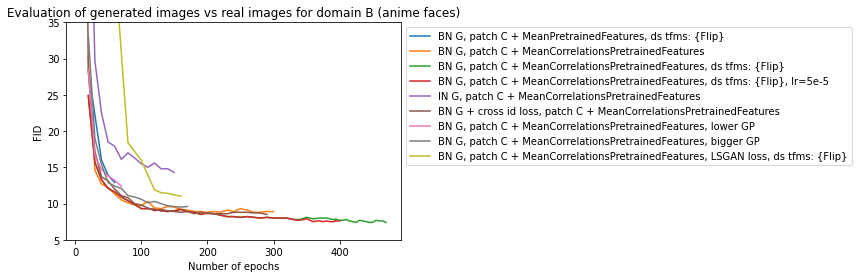

In [47]:
#plot_fids_vs_epochs(fids_tr2a_a2b_ema_dict, label=model_descriptions['2a'])
plot_fids_vs_epochs(fids_tr2f2_a2b_ema_dict, label=model_descriptions['2f2'])
plot_fids_vs_epochs(fids_tr2h_a2b_ema_dict, label=model_descriptions['2h'])
plot_fids_vs_epochs(fids_tr2h2_a2b_ema_dict, label=model_descriptions['2h2'])
plot_fids_vs_epochs(fids_tr2h2_lr5e5_a2b_ema_dict, label=model_descriptions['2h2']+', lr=5e-5')
plot_fids_vs_epochs(fids_tr3h_a2b_ema_dict, label=model_descriptions['3h'])
#plot_fids_vs_epochs(fids_tr4h_a2b_ema_dict, label=model_descriptions['4h'])
ax=plot_fids_vs_epochs(fids_tr5h_a2b_ema_dict, label=model_descriptions['5h'])
ax=plot_fids_vs_epochs(fids_tr7h_a2b_ema_dict, label=model_descriptions['7h'])
ax=plot_fids_vs_epochs(fids_tr8h_a2b_ema_dict, label=model_descriptions['8h'])
ax=plot_fids_vs_epochs(fids_tr9h2_a2b_ema_dict, label=model_descriptions['9h2'])
ax.set_ybound(5, 35)
ax.set_title('Evaluation of generated images vs real images for domain B (anime faces)')
_ = ax.legend(loc='upper left', bbox_to_anchor=(1., 1.))

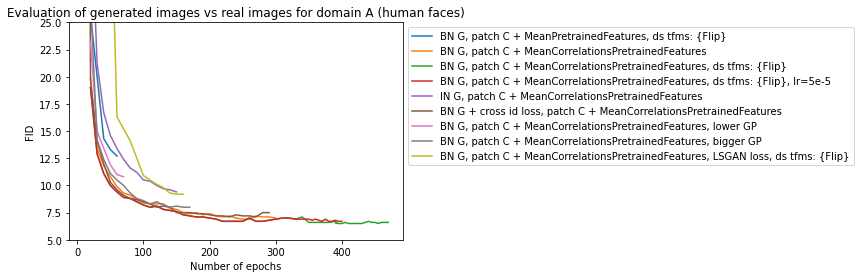

In [48]:
#plot_fids_vs_epochs(fids_tr2a_b2a_ema_dict, label=model_descriptions['2a'])
plot_fids_vs_epochs(fids_tr2f2_b2a_ema_dict, label=model_descriptions['2f2'])
plot_fids_vs_epochs(fids_tr2h_b2a_ema_dict, label=model_descriptions['2h'])
plot_fids_vs_epochs(fids_tr2h2_b2a_ema_dict, label=model_descriptions['2h2'])
plot_fids_vs_epochs(fids_tr2h2_lr5e5_b2a_ema_dict, label=model_descriptions['2h2']+', lr=5e-5')
plot_fids_vs_epochs(fids_tr3h_b2a_ema_dict, label=model_descriptions['3h'])
#plot_fids_vs_epochs(fids_tr4h_b2a_ema_dict, label=model_descriptions['4h'])
plot_fids_vs_epochs(fids_tr5h_b2a_ema_dict, label=model_descriptions['5h'])
plot_fids_vs_epochs(fids_tr7h_b2a_ema_dict, label=model_descriptions['7h'])
plot_fids_vs_epochs(fids_tr8h_b2a_ema_dict, label=model_descriptions['8h'])
ax=plot_fids_vs_epochs(fids_tr9h2_b2a_ema_dict, label=model_descriptions['9h2'])
ax.set_ybound(5, 25)
ax.set_title('Evaluation of generated images vs real images for domain A (human faces)')
_ = ax.legend(loc='upper left', bbox_to_anchor=(1., 1.))

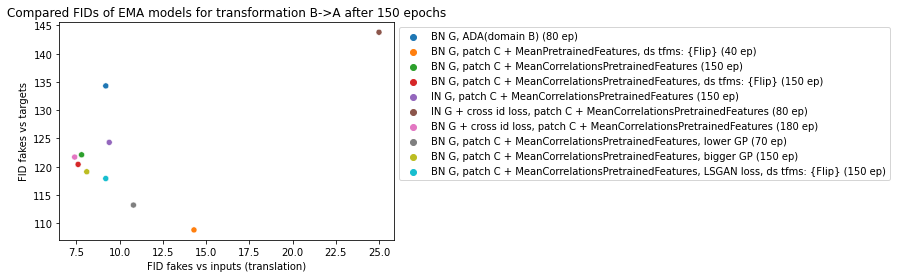

In [49]:
ax = plot_fids_vs_inputs_targets(150, Domain.A, use_ema_models=True)
_ = ax.legend(loc='upper left', bbox_to_anchor=(1., 1.))

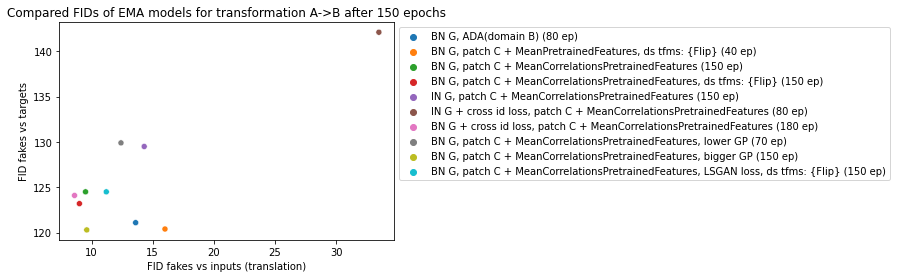

In [50]:
ax = plot_fids_vs_inputs_targets(150, Domain.B, use_ema_models=True)
_ = ax.legend(loc='upper left', bbox_to_anchor=(1., 1.))

# Samples comparison

Models .pth files are expected to be located in `models_dir` and follow the pattern: {**ds_name**}\_tr{**tr_id**}[\_{additional tr descriptor}]\_{**num_epochs**}ep[_ema].pth

For example:

* face2anime_bidir_17kds_tr9h2_50ep_ema.pth
* face2anime_bidir_17kds_tr2hx_lr5e5_400ep_ema.pth
* face2anime_bidir_17kds_tr3h_150ep.pth

In [ ]:
models_dir = Path('/kaggle/input/face2anime-bidir-17kds-weights/')

In [52]:
def get_epoch_from_path(path):
    fn = path.name
    ep_str_end = fn.index('ep_') if 'ep_' in fn else fn.index('ep.')
    ep_str_begin = ep_str_end - ''.join(reversed(fn[:ep_str_end])).index('_')
    return int(fn[ep_str_begin:ep_str_end])


def get_model_id_from_path(path, full=False):
    fn = path.name
    id_str_begin_idx = fn.index('_tr') + 3
    ep_str_idx = fn.index('ep_') if 'ep_' in fn else fn.index('ep.')
    id_str_end_idx = ((ep_str_idx - ''.join(reversed(fn[:ep_str_idx])).index('_') - 1) if full 
                      else fn.index('_', id_str_begin_idx))
    return fn[id_str_begin_idx:id_str_end_idx]


class ModelInfo:
    def __init__(self, pth_path):
        self.path = pth_path
        self.id = get_model_id_from_path(pth_path)
        self.full_id = get_model_id_from_path(pth_path, full=True)
        self.epoch = get_epoch_from_path(pth_path)
        self.is_ema = '_ema' in str(pth_path)


def get_loaded_learn(model_info):
    builder = globals()[f'create_learner_{model_info.id}']
    learn = builder(for_inference=True)
    # Generator is stored alone for EMA models. For regular models, it's stored 
    # together with critic
    module_to_load = learn.ema_model if model_info.is_ema else learn.model
    load_model(model_info.path, module_to_load, None, with_opt=False, device=device)
    g_module = learn.ema_model if model_info.is_ema else learn.model.generator
    g_learn = Learner(dls, g_module, loss_func=lambda *args: torch.tensor(0.))    
    return g_learn
        

class ImgsPlotDistribution(ABC):
    @abstractmethod
    def get_axes(self, model_idx:int, sample_idx:int, out_domain:Domain) -> plt.Axes:
        "Returns the Axes where the `sample_idx`th sample of domain `out_domain` generated by `model_idx`th model must be shown."
        pass
    
    def get_input_axes(self, sample_idx:int, out_domain:Domain):
        "Returns the Axes where the `sample_idx`th input sample of domain `reverse_domain(out_domain)` must be shown."
        pass


class ImgsPlotDistribution1Row1SampleEachDomainAllModels:
    def __init__(self, n_models, n_imgs):
        self.n_models, self.n_imgs = n_models, n_imgs
        img_sz = 2
        _, self.axs = plt.subplots(n_imgs, 2 * (n_models + 1), 
                                   figsize=(img_sz * 2 * (n_models + 1), n_imgs * img_sz * 1.05))
    
    def _get_in_img_col_idx(self, out_domain:Domain):
        return 0 if out_domain == Domain.B else self.n_models + 1
    
    def get_axes(self, model_idx:int, sample_idx:int, out_domain:Domain):
        in_img_col_idx = self._get_in_img_col_idx(out_domain)
        return self.axs[sample_idx][in_img_col_idx + model_idx + 1]
    
    def get_input_axes(self, sample_idx:int, out_domain:Domain):
        in_img_col_idx = self._get_in_img_col_idx(out_domain)
        return self.axs[sample_idx][in_img_col_idx]

    
class ImgsPlotDistribution1Row1Sample1DomainAllModels:
    def __init__(self, n_models, n_imgs):
        self.n_models, self.n_imgs = n_models, n_imgs
        img_sz = 2.5
        n_cols = n_models + 1
        axs_list = [plt.subplots(n_imgs, n_cols, figsize=(img_sz * (n_models + 1), n_imgs * img_sz * 1.05))[1]
                    for _ in range(2)]
        self.axs_a2b, self.axs_b2a = axs_list
    
    def _get_axs(self, out_domain:Domain):
        return self.axs_a2b if out_domain == Domain.B else self.axs_b2a
    
    def get_axes(self, model_idx:int, sample_idx:int, out_domain:Domain):
        axs = self._get_axs(out_domain)
        return axs[sample_idx][model_idx + 1]
    
    def get_input_axes(self, sample_idx:int, out_domain:Domain):
        axs = self._get_axs(out_domain)
        return axs[sample_idx][0]
    

def get_models(models_dir, epochs:List=None, ids:List=None):
    def _filter_model(model): 
        return (((epochs is None) or (model.epoch in epochs))
                and ((ids is None) or (model.full_id in ids)))
    all_models = [ModelInfo(p) for p in models_dir.ls() if p.suffix == '.pth']
    return [m for m in all_models if _filter_model(m)]


def sorted_models(models:List[ModelInfo]):
    return sorted(models, key=lambda m: (m.full_id, m.epoch))


def plot_samples(models:List[ModelInfo], n_imgs=20, max_bs=64,  
                     plot_dist:ImgsPlotDistribution=None):
    if plot_dist is None: 
        plot_dist = ImgsPlotDistribution1Row1SampleEachDomainAllModels(len(models), n_imgs)
    
    non_random_dls = get_dblock(random_fn_a=False).dataloaders(main_path, path=main_path, bs=bs)
    dl = non_random_dls.test_dl(non_random_dls.train.items[:n_imgs], bs=min(n_imgs, max_bs))
    
    for model_idx, model in enumerate(sorted_models(models)):
        learn = get_loaded_learn(model)
        
        inp, _, _, dec_imgs_t = learn.get_preds(dl=dl, with_input=True, with_decoded=True)
        preds_batch = dls.decode_batch(inp + dec_imgs_t, max_n=n_imgs)           
                
        for i, (in_a, in_b, pred_a2b, pred_b2a) in enumerate(preds_batch):
            if model_idx == 0:
                in_a.show(ax=plot_dist.get_input_axes(i, Domain.B), title='In A')
                in_b.show(ax=plot_dist.get_input_axes(i, Domain.A), title='In B')  
            ema_str = ' E' if model.is_ema else ''
            pred_a2b.show(ax=plot_dist.get_axes(model_idx, i, Domain.B), 
                          title=f'A->B {model.full_id}{ema_str} {model.epoch}ep')
            pred_b2a.show(ax=plot_dist.get_axes(model_idx, i, Domain.A), 
                          title=f'B->A {model.full_id}{ema_str} {model.epoch}ep')
            
        learn = None
        clean_mem()

Here we show samples generated by different models trained 150 epochs:

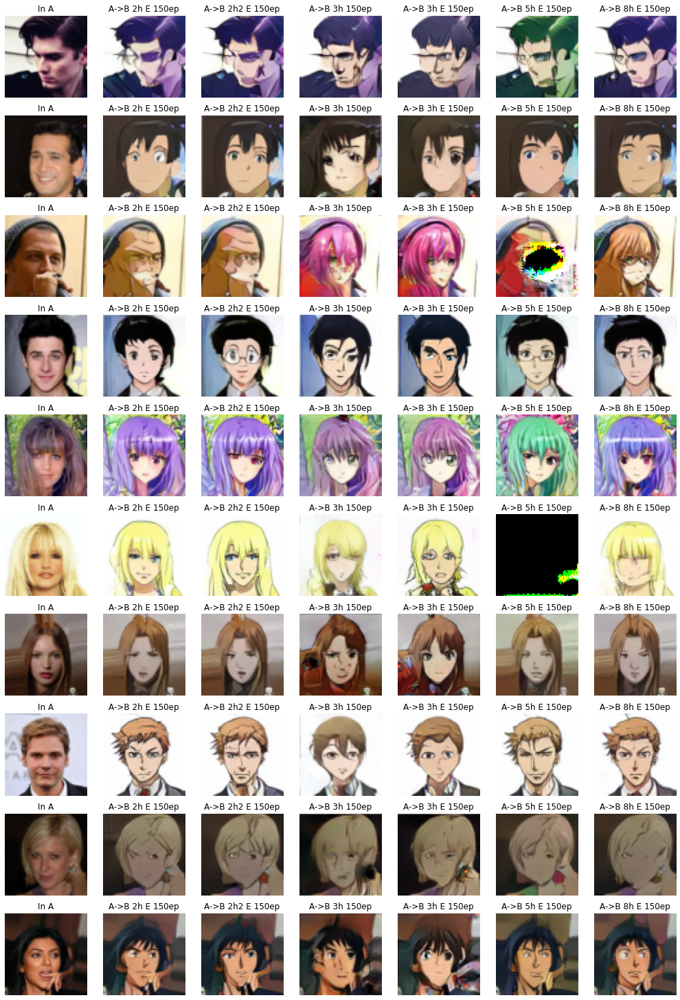

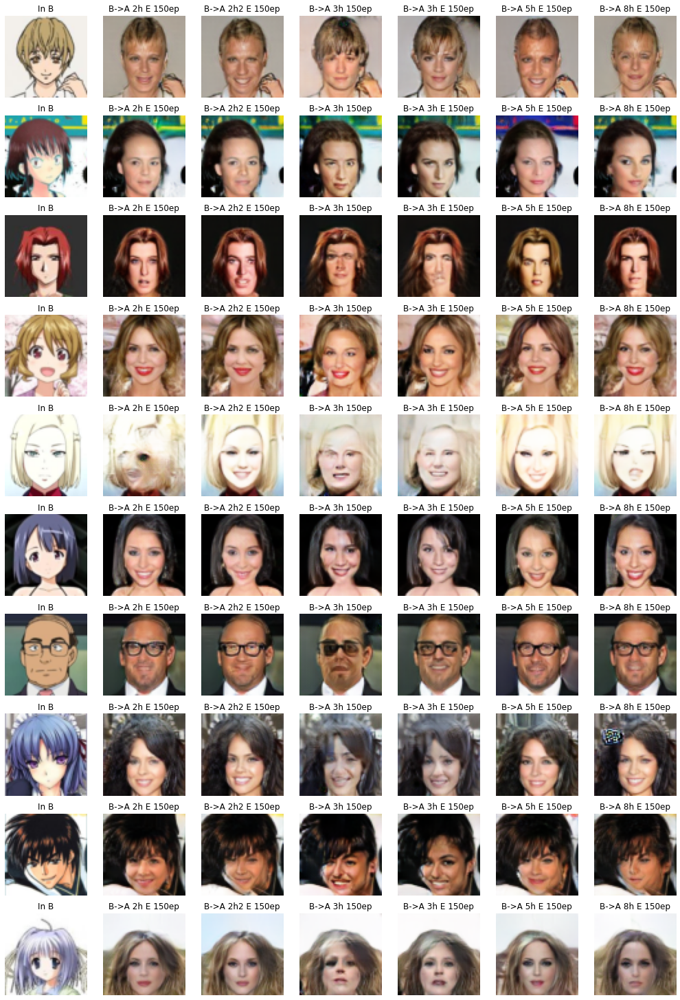

In [53]:
models_info = get_models(models_dir, epochs=[150])
n_models = len(models_info)
n_imgs = 10
plot_dist=ImgsPlotDistribution1Row1Sample1DomainAllModels(n_models, n_imgs)
plot_samples(models_info, n_imgs=n_imgs, plot_dist=plot_dist)

Next, we compare the best version of the models that were good enough to be trained more epochs:

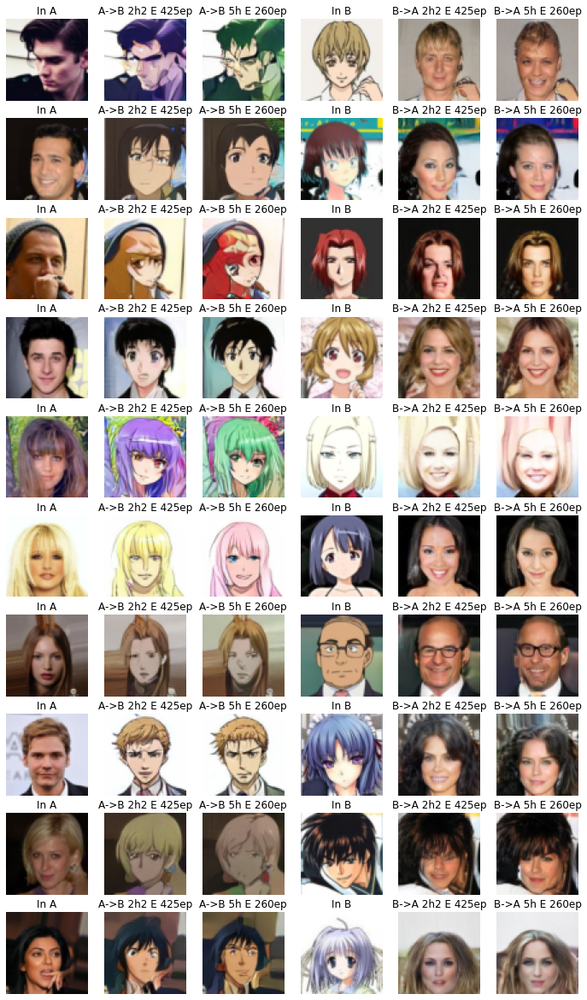

In [54]:
models_info = get_models(models_dir, epochs=[260, 425], ids=['2h2', '5h'])
plot_samples(models_info, n_imgs=10)

The lack of the original identity loss diminishes color preservation for model 5h, although it sometimes leads to more realistic images.

Finally, we show the progression of best model since epoch 150:

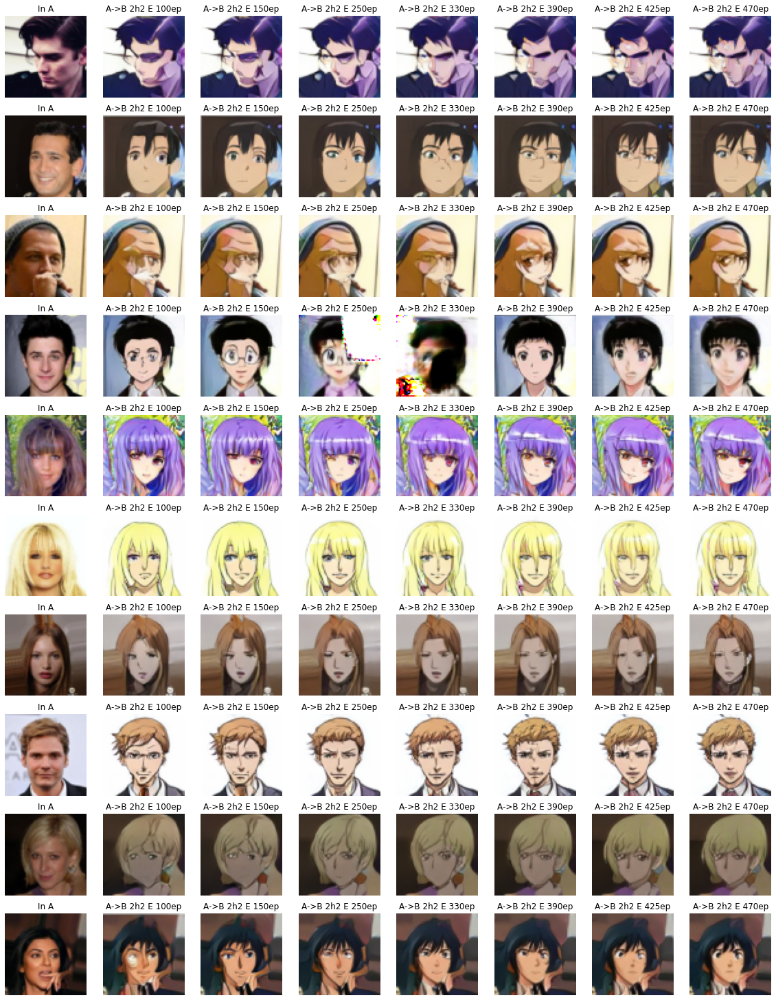

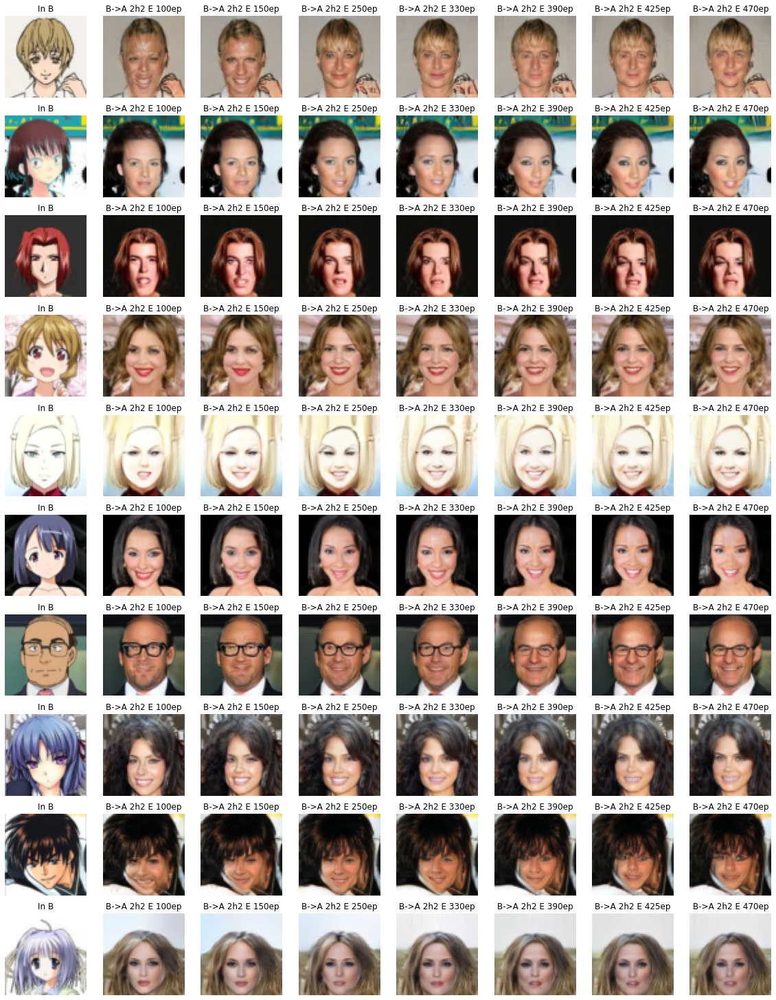

In [55]:
models_info = get_models(models_dir, ids=['2h2'])
n_models = len(models_info)
n_imgs = 10
plot_dist=ImgsPlotDistribution1Row1Sample1DomainAllModels(n_models, n_imgs)
plot_samples(models_info, n_imgs=n_imgs, plot_dist=plot_dist)

There's hardly any noticeable improvement after 250 epochs, although FID improves from 6.7 to 6.5 and 8.1 to 7.4 for domains A and B, respectively.